In [8]:
import os

In [40]:
import numpy as np
import sklearn
import matplotlib.pyplot as plt

In [3]:

import pandas as pd

In [4]:
train = pd.read_csv('./train.csv')

In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300000 entries, 0 to 299999
Data columns (total 16 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   id      300000 non-null  int64  
 1   cont1   300000 non-null  float64
 2   cont2   300000 non-null  float64
 3   cont3   300000 non-null  float64
 4   cont4   300000 non-null  float64
 5   cont5   300000 non-null  float64
 6   cont6   300000 non-null  float64
 7   cont7   300000 non-null  float64
 8   cont8   300000 non-null  float64
 9   cont9   300000 non-null  float64
 10  cont10  300000 non-null  float64
 11  cont11  300000 non-null  float64
 12  cont12  300000 non-null  float64
 13  cont13  300000 non-null  float64
 14  cont14  300000 non-null  float64
 15  target  300000 non-null  float64
dtypes: float64(15), int64(1)
memory usage: 36.6 MB


In [80]:
import matplotlib.pyplot as plt
import seaborn as sns


/home/rhythm/anaconda3/envs/widgets-tutorial/lib/python3.8/site-packages/seaborn/axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


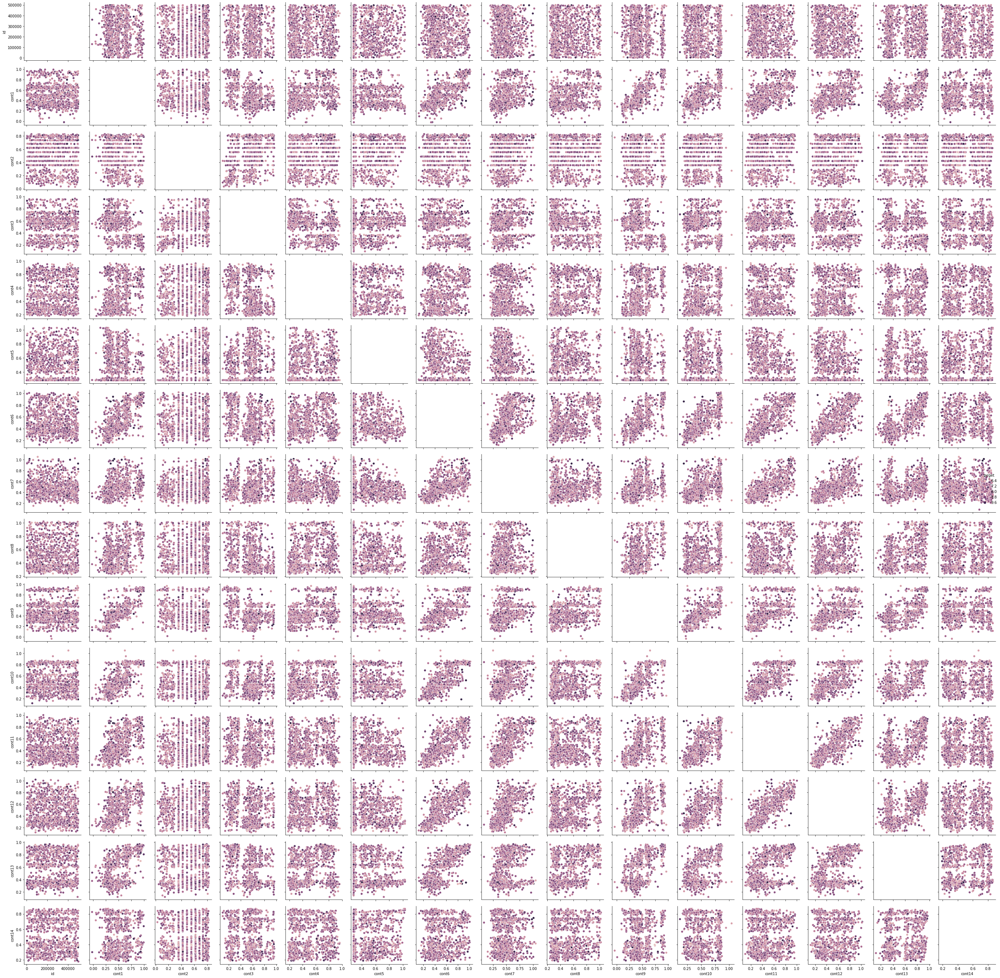

In [10]:
sns.pairplot( data = train.sample(1000), hue = "target", size = 2.5)
plt.tight_layout()
plt.show()

In [12]:
#looking at th co-relation matrix
ax = sns.heatmap(train, annot = True, cmap = "YlGnBu")

/home/rhythm/anaconda3/envs/widgets-tutorial/lib/python3.8/site-packages/seaborn/axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


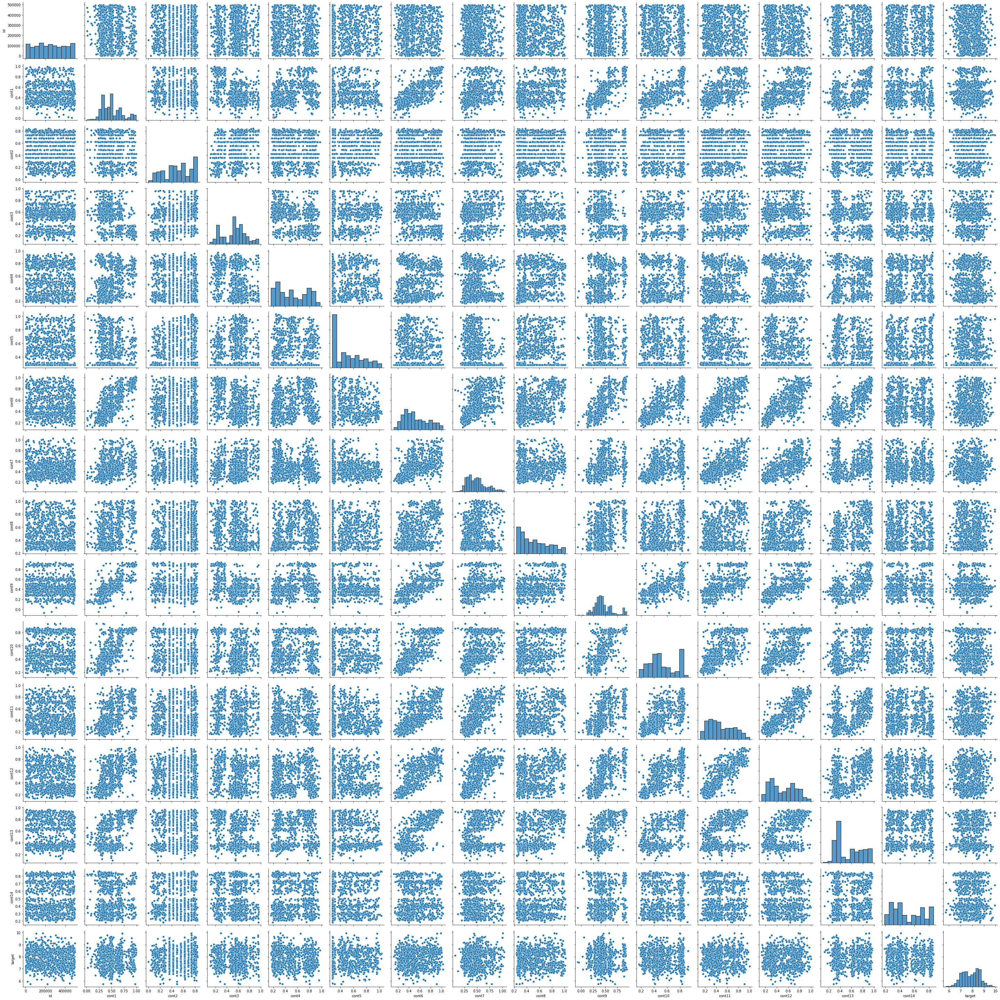

In [81]:
sns.pairplot( data = train.sample(1000), size = 2.5)
plt.tight_layout()
plt.show()

### defining linear-regression class

In [36]:
class LinearRegressionGD:
    def __init__(self, eta = 0.001, n_iter = 20):
        self.eta = eta
        self.n_iter = n_iter
    
    def fit(self, X, y) :
        self.w_ = np.zeros(1 + X.shape[1])
        self.cost_ = []
        for i in range (self.n_iter) :
            output = self. net_input(X)
            error = (y - output)
            self.w_[1:] += self.eta*X.T.dot(error)
            self.w_[0] += self.eta*error.sum()
            cost = (error**2).sum()/2
            self.cost_.append(cost)
        return self

    def net_input(self, X):
        return np.dot(X, self.w_[1:] + self.w_[0])

    def predict(self, X):
        return(self.net_input(X))

In [31]:
#let's see what we get 11 and 12 are correlted
X = train[["cont11"]].values
y = train["target"].values

In [32]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_std = sc.fit_transform(X)
y_std = sc.fit_transform(y[:, np.newaxis]).flatten()#look at pg 321 Raschak

In [37]:
lr = LinearRegressionGD()
lr.fit(X_std, y_std)

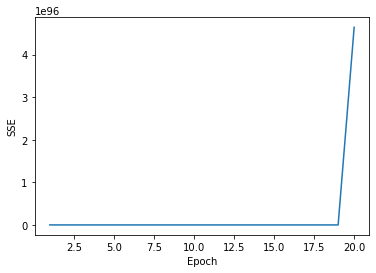

In [41]:
#plotting the error / costvs number of iter == epoch
plt.plot(range(1, lr.n_iter +1), lr.cost_)
plt.ylabel("SSE")
plt.xlabel("Epoch")
plt.show()

In [42]:
from sklearn.linear_model import LinearRegression
slr = LinearRegression()
slr.fit(X, y)
print('slope : ', slr.coef_[0])

slope :  0.16986205494820972


In [43]:
print('intercept : %.3f' %slr.intercept_)

intercept : 7.823


In [47]:
def lin_regplot(X, y, model) :
    plt.scatter(X, y, c = 'steelblue', edgecolors='white')
    plt.plot(X, model.predict(X), color = 'black', lw = 2)
    return None


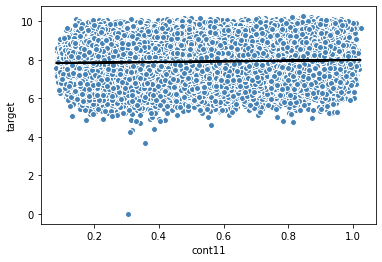

In [48]:
lin_regplot(X, y, slr)
plt.xlabel('cont11')
plt.ylabel('target')
plt.show()

* we see there is an outlier

*to get rid of the outlier we try RANdom SAmple Consensus (RANSAC) algorithm which fits the regression model*

In [50]:
from sklearn.linear_model import RANSACRegressor
ransac = RANSACRegressor(LinearRegression(),
                        max_trials = 100, # max number of iter
                        min_samples = 50, #minimum number of samples randomly chosen
                        loss = 'absolute_error', # computes vertical dist btwn fitted line and sample points
                        residual_threshold = 5.0, # if vert dist less than 5 unit
                        random_state = 0)
ransac.fit(X, y)

RANSACRegressor(estimator=LinearRegression(), min_samples=50, random_state=0,
                residual_threshold=5.0)

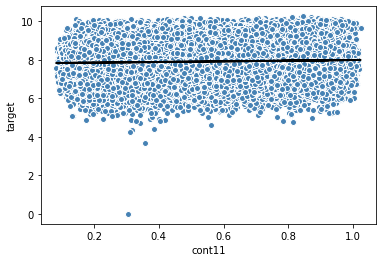

In [51]:
lin_regplot(X, y, ransac)
plt.xlabel('cont11')
plt.ylabel('target')
plt.show()

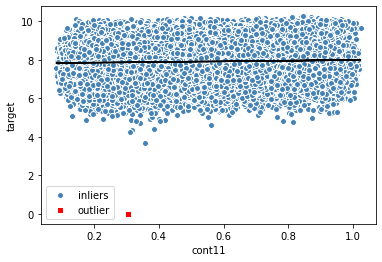

In [56]:
#plotting the inlier from ds 
inlier_mask = ransac.inlier_mask_
outlier_mask = np.logical_not(inlier_mask)
plt.scatter(X[inlier_mask], y[inlier_mask], marker ='o', c = 'steelblue', edgecolors='white', label = 'inliers')
plt.scatter(X[outlier_mask], y[outlier_mask], marker = 's',c = 'red', edgecolors='white', label = 'outlier')
plt.plot(X, ransac.predict(X), color = 'black')
plt.xlabel('cont11')
plt.ylabel('target')
plt.legend()
plt.show()

In [57]:
display('slope : %.3f' % ransac.estimator_.coef_[0])

'slope : 0.170'

In [67]:
#splitting the dataset
from sklearn.model_selection import train_test_split
y = train['target'].values
X = train.drop('target', axis = 1).values

In [71]:
X_train,  X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=42)
display(X_train.shape)
display(y_train.shape)
display(X_test.shape)
display(y_test.shape)

(210000, 15)

(210000,)

(90000, 15)

(90000,)

In [72]:
slr = LinearRegression()
slr.fit(X_train, y_train)
y_train_pred = slr.predict(X_train)
y_test_pred = slr.predict(X_test)

Text(0, 0.5, 'Residuala')

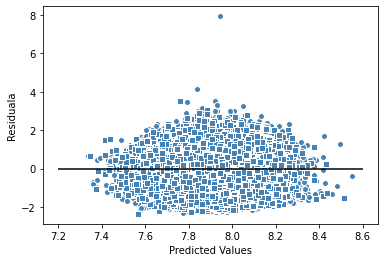

In [74]:
plt.scatter(y_train_pred, y_train_pred - y_train, c = 'steelblue', marker = 'o', edgecolors= 'white', label = 'Training Data')
plt.scatter(y_test_pred, y_test_pred - y_test, color = 'steelblue', marker = 's', edgecolors='white', label = 'test')
plt.hlines(y = 0, xmin = 7.2,  xmax = 8.6, color = 'black')
plt.xlabel('Predicted Values')
plt.ylabel('Residuala')

the residual should be idwally = 0. 
We see i distributed around 0
would want error to be randomly distributed
randomly scattered around 0
* we also see there is an outlier since a point is with large standard deviation and also points arounf 4
* however if there is a pattrn the model is unable to capture it

### MSE 
* to compare different regression model
* to tune parameters via grod search or cross-validation(normalises sse with sample size)

In [77]:
from sklearn.metrics import mean_squared_error
print(' MSE train : %0.3f, test : %.3f' % (mean_squared_error(y_train, y_train_pred)
                            , mean_squared_error(y_test, y_test_pred)  ))

 MSE train : 0.529, test : 0.525


* MSE will never be negative since the errors are squared. 
*  the error ranges from zero to infinity. 
* MSE increases exponentially with an increase in error.
* A good model will have an MSE value closer to zero.

### coefficient of determination = $R^2$

$R^2 = 1 - \frac{SSE}{SST}$
$SST = \sum (y^(i) - \mu_y)^2$
 * $R^2$ rescaled MSE, $1 - \frac{MSE}{Var(y)}$   
 * $R^2$ bounded between 0 and 1
 * $R^2$  = 1 => model fits perfectly corresponding to MSE = 0

In [78]:
from sklearn.metrics import r2_score 
print('R^2 score train : %.3f, test : %.3f' % (r2_score(y_train, y_train_pred), 
                                               r2_score(y_test, y_test_pred)))

R^2 score train : 0.019, test : 0.018


* Ridge regression $\lambda w^2$
* lasso - Least absolute shrinkage selection operator $\lambda |w|$  

## Polynomial regression

In [93]:
# checking the polynomial fit and linear fit as well
X = train[['cont9']].values
y = train['target'].values
from sklearn.preprocessing import PolynomialFeatures
regr = LinearRegression()
quadratic = PolynomialFeatures( degree = 2)
cubic = PolynomialFeatures(degree = 3)
X_quad = quadratic.fit_transform(X)
X_cubic = cubic.fit_transform(X)

# fit features
regr = regr.fit(X, y)
y_pred_lin = regr.predict(X)
linear_r2 = r2_score(y, y_pred_lin)
#display the coefficient of the quadratic
print('ax^2 + bx +c c = %.3f, b = %.3f a '% (regr.intercept_, regr.coef_))



ax^2 + bx +c c = 7.928, b = -0.049 a 


In [84]:
regr = regr.fit(X_quad, y)
y_pred_quad = regr.predict(X_quad)
quad_r2 = r2_score(y, y_pred_quad)


In [85]:
regr = regr.fit(X_cubic, y)
y_pred_cubic = regr.predict(X_cubic)
cubic_r2 = r2_score(y, y_pred_cubic)


/home/rhythm/anaconda3/envs/widgets-tutorial/lib/python3.8/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


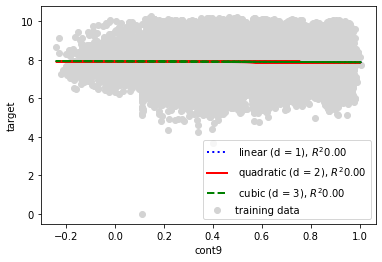

In [87]:
plt.scatter(X, y, label = 'training data', color = 'lightgray')
plt.plot(X, y_pred_lin, label = ' linear (d = 1), $R^2 %.2f$' %linear_r2, color = 'blue', linestyle = ':', linewidth = 2)
plt.plot(X, y_pred_quad, label = ' quadratic (d = 2), $R^2 %.2f$' %quad_r2, color = 'red', linestyle = '-', linewidth = 2)
plt.plot(X, y_pred_lin, label = ' cubic (d = 3), $R^2 %.2f$' %cubic_r2, color = 'green', linestyle = '--', linewidth = 2)
plt.xlabel('cont9')
plt.ylabel('target')
plt.legend()
plt.show()

# .... O'riely bok chapter - 4 polynomial regression 

In [88]:
X_quad[0]

array([1.        , 0.55824544, 0.31163797])

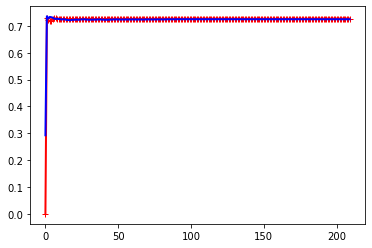

In [95]:
train_errors, test_errors =[], []
for m in range(1, len(X_train), 1000):
    regr.fit(X_train[:m], y_train[:m])
    y_train_predict = regr.predict(X_train[:m])
    y_test_predict = regr.predict(X_test[:m])    
    train_errors.append(mean_squared_error(y_train[:m], y_train_predict))
    test_errors.append(mean_squared_error(y_test[:m], y_test_predict))

plt.plot(np.sqrt(train_errors), 'r-+', lw = 2 , label = 'train')
plt.plot(np.sqrt(test_errors), 'b-', lw = 2, label = 'test')
plt.show()

we see the curve starts from zero when there are just a coupld of training set. - it fits them well 
as new instances added - nosie adds
* curve gets closer when larger training set.
* to improvr OVERFITTING add more training data until validation error reaches training error

In [96]:
from sklearn.linear_model import Ridge
ridge_reg = Ridge(alpha = 1, solver = 'cholesky') #solving matrix factorization by cholesky
ridge_reg.fit(X_train, y_train)

Ridge(alpha=1, solver='cholesky')

In [104]:
ridge_reg.predict(X_test)

array([7.83171369, 7.94656047, 7.96594278, ..., 7.86040433, 7.74758447,
       7.90028625])

In [109]:
#using SGD Regressor
from sklearn.linear_model import SGDRegressor
sgd_reg = SGDRegressor(penalty ='l2')
sgd_reg.fit(X,y.ravel())
sgd_reg.predict(X_test.reshape(-1,1))

array([-354.6515034 ,    7.91206691,    7.90758795, ...,    7.92534402,
          7.91975806,    7.9213012 ])

just added regressor term  in sgd cost function. which makes it similar to the ridge
could have added  solver = sag == stochastic average of GD

In [110]:
from sklearn.linear_model import Lasso
lasso_reg = Lasso(alpha = 0.1)
lasso_reg.fit(X_train, y_train)
lasso_reg.predict(X_test)

array([7.90279163, 7.90339629, 7.90422067, ..., 7.90603698, 7.90597243,
       7.90569834])